## Exploratory Data Analysis

In [ ]:
# Import pandas and numpy to clean data
import pandas as pd
import numpy as np

In [ ]:
# Read in path of covid data and convert to dataframe
path="https://data.cityofchicago.org/api/views/yhhz-zm2v/rows.csv?accessType=DOWNLOAD"
covid_df=pd.read_csv(path)
covid_df.head()

In [ ]:
# Review names of columns
covid_df.columns.values

In [ ]:
# Identify data types
covid_df.dtypes

In [ ]:
# Check to make sure all zip codes are workable
covid_df["ZIP Code"].unique()

In [ ]:
# Drop unknown zip codes
covid_df=covid_df[covid_df["ZIP Code"] != "Unknown"]

In [ ]:
# Identify dates of data
covid_df["Week Start"].unique()

In [ ]:
# Convert week start to date time format
covid_df["Week Start"]=pd.to_datetime(covid_df["Week Start"],format="%m/%d/%Y")
covid_df=covid_df.sort_values(by="Week Start",ascending=False)
covid_df.head()

In [ ]:
# Replace NaN with 0
covid_df.replace(np.nan,0,inplace=True)

In [ ]:
# Review data frame
covid_df.head()

In [ ]:
# Create a new data frame using the most recent start of week
recent_df=covid_df.loc[covid_df["Week Start"]==covid_df["Week Start"].max()]
recent_df.head()

In [ ]:
# Assign cumulative and location columns to a new df
columns=["ZIP Code", "Cases - Cumulative", "Case Rate - Cumulative", "Tests - Cumulative","Test Rate - Cumulative", "Percent Tested Positive - Cumulative","Deaths - Cumulative", "Death Rate - Cumulative","Population","ZIP Code Location"]
working_df=recent_df[columns]
working_df.head()

In [ ]:
# Rename columns and reset index
colNames=["ZIP Code", "Cases", "Cases per 100K", "Tests","Tests per 100K", "Percent Tested Positive", "Deaths","Deaths per 100K","Population","Location"]
working_df.columns=colNames
working_df.sort_values(by="ZIP Code", ascending=True,inplace=True)
working_df.reset_index(drop=True,inplace=True)
working_df.head()

In [ ]:
#Check that all location points have data
working_df["Location"].unique()

In [ ]:
#convert location column to a string
working_df["Location"]=working_df["Location"].astype(str)
working_df["Location"]=working_df["Location"].str.replace("POINT \(", "")
working_df["Location"]=working_df["Location"].str.replace("\)","")
working_df.head()

In [ ]:
#Split the location column and remove it
working_df[["Longitude","Latitude"]]=working_df["Location"].str.split(expand=True)
working_df.drop(columns=["Location"],axis=1,inplace=True)
working_df.set_index(["ZIP Code"],drop=True)
working_df.head()

In [ ]:
#Save a csv copy
working_df.to_csv("CovidCleanData.csv")

### Clustering

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
from geopy.geocoders import Nominatim
import geopandas as gpd
import folium

# Matplotlib and associated plotting modules
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

In [ ]:
# Set location around Chicago
address = 'Chicago, IL'

geolocator = Nominatim(user_agent="chi_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Chicago are {}, {}.'.format(latitude, longitude))

In [ ]:
city_url="https://data.cityofchicago.org/api/geospatial/gdcf-axmw?method=export&format=GeoJSON"
city_geo=gpd.read_file(city_url)
print(city_geo.dtypes)
chicago_data=working_df

In [ ]:

CLIENT_ID = '*******' # your Foursquare ID
CLIENT_SECRET = '*******' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

In [ ]:
zipcode_latitude = chicago_data.loc[0, 'Latitude'] # zipcode latitude value
zipcode_longitude = chicago_data.loc[0, 'Longitude'] # zipcode longitude value

zipcode_name = chicago_data.loc[0, 'ZIP Code'] # zipcode name

print('Latitude and longitude values of {} are {}, {}.'.format(zipcode_name, 
                                                               zipcode_latitude, 
                                                               zipcode_longitude))

In [ ]:
# type your answer here
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    zipcode_latitude, 
    zipcode_longitude, 
    radius, 
    LIMIT)
url # display URL

In [ ]:
results = requests.get(url).json()
results

In [ ]:
# Function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [ ]:
# Create a venues object
venues = results['response']['groups'][0]['items']   
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

In [ ]:
# Function to gather the nearby venues
def getNearbyVenues(names, latitudes, longitudes, radius=2500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['ZIP Code', 
                  'ZIP Code Latitude', 
                  'ZIP Code Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [ ]:
# New data frame to use getNearbyVenues function
chicago_venues = getNearbyVenues(names=chicago_data['ZIP Code'],
                                   latitudes=chicago_data['Latitude'],
                                   longitudes=chicago_data['Longitude']
                                  )

In [ ]:
print(chicago_venues.shape)
chicago_venues.head()

In [ ]:
chicago_venues.groupby('ZIP Code').count()

In [ ]:
# One hot encoding
chicago_onehot = pd.get_dummies(chicago_venues[['Venue Category']], prefix="", prefix_sep="")

# Add zipcode column back to dataframe
chicago_onehot['ZIP Code'] = chicago_venues['ZIP Code'] 

# Move zipcode column to the first column
fixed_columns = [chicago_onehot.columns[-1]] + list(chicago_onehot.columns[:-1])
chicago_onehot = chicago_onehot[fixed_columns]

chicago_onehot.head()

In [ ]:
chicago_onehot.shape

In [ ]:
chicago_grouped = chicago_onehot.groupby('ZIP Code').mean().reset_index()
chicago_grouped.head()

In [ ]:
chicago_grouped.shape

In [ ]:
# Print out top 5 venue frequency per zip code
num_top_venues = 5

for hood in chicago_grouped['ZIP Code']:
    print("----"+str(hood)+"----")
    temp = chicago_grouped[chicago_grouped['ZIP Code'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

In [ ]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [ ]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['ZIP Code']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
zipcode_venues_sorted = pd.DataFrame(columns=columns)
zipcode_venues_sorted['ZIP Code'] = chicago_grouped['ZIP Code']

for ind in np.arange(chicago_grouped.shape[0]):
    zipcode_venues_sorted.iloc[ind, 1:] = return_most_common_venues(chicago_grouped.iloc[ind, :], num_top_venues)

zipcode_venues_sorted.head()

In [ ]:
# function returns WSS score for k values from 1 to kmax
def calculate_WSS(points, kmax):
  sse = []
  for k in range(1, kmax+1):
    kmeans = KMeans(n_clusters = k).fit(points)
    centroids = kmeans.cluster_centers_
    pred_clusters = kmeans.predict(points)
    curr_sse = 0
    
    # calculate square of Euclidean distance of each point from its cluster center and add to current WSS
    for i in range(len(points)):
      curr_center = centroids[pred_clusters[i]]
      curr_sse += (points[i, 0] - curr_center[0]) ** 2 + (points[i, 1] - curr_center[1]) ** 2
      
    sse.append(curr_sse)
  plt.title(label="Elbow Method")
  plt.plot(np.arange(1,11,1),sse)  
  return sse

    

In [ ]:
chicago_grouped_clustering = chicago_grouped.drop('ZIP Code', 1)

chicago_grouped_clustering.head()


[0.0037238385734267403,
 0.0034634468804762442,
 0.0033856518442218313,
 0.0033630712759344862,
 0.003370933114352131,
 0.0032800340771551315,
 0.0030093115488343037,
 0.0032835911114578744,
 0.0026019257792491662,
 0.001706427188275432]

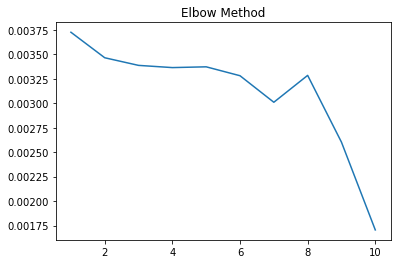

In [40]:
# Elbow method to determine K
calculate_WSS(chicago_grouped_clustering.values, 10)

In [ ]:
# Silhouette method to determine K

sil = []
kmax = 10

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k).fit(chicago_grouped_clustering.values)
  labels = kmeans.labels_
  sil.append(silhouette_score(chicago_grouped_clustering.values, labels, metric = 'euclidean'))

plt.plot(np.arange(2,11,1,),sil,label="Silhouette Score")
print(sil)

For n_clusters = 2 The average silhouette_score is : 0.1665723270891692
For n_clusters = 3 The average silhouette_score is : 0.15047048679865294
For n_clusters = 4 The average silhouette_score is : 0.1470070587179328
For n_clusters = 5 The average silhouette_score is : 0.15555237792146198
For n_clusters = 6 The average silhouette_score is : 0.13742562981487758
For n_clusters = 7 The average silhouette_score is : 0.1272300422104871
For n_clusters = 8 The average silhouette_score is : 0.14589213933434758
For n_clusters = 9 The average silhouette_score is : 0.10984575784731371
For n_clusters = 10 The average silhouette_score is : 0.11869020559075634


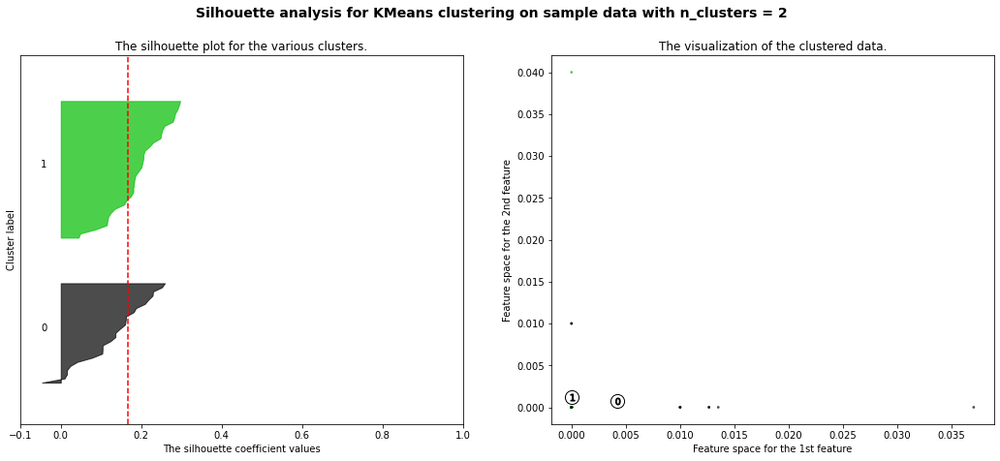

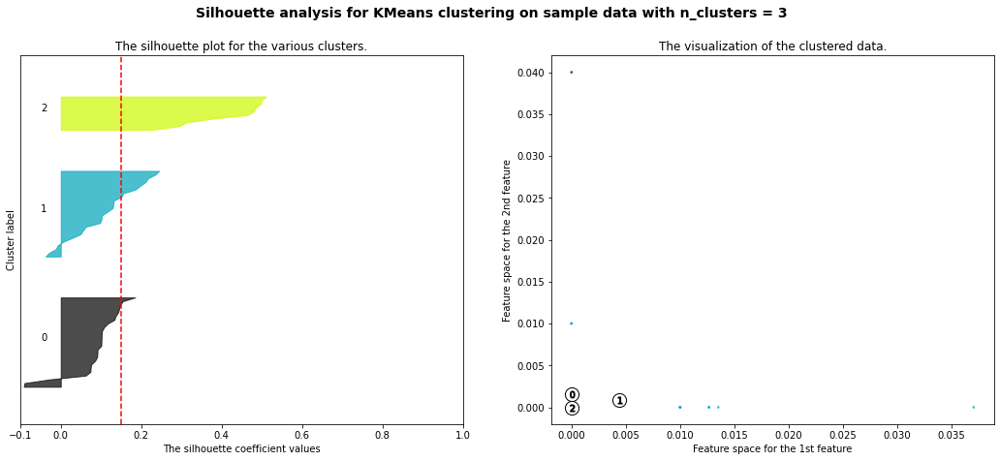

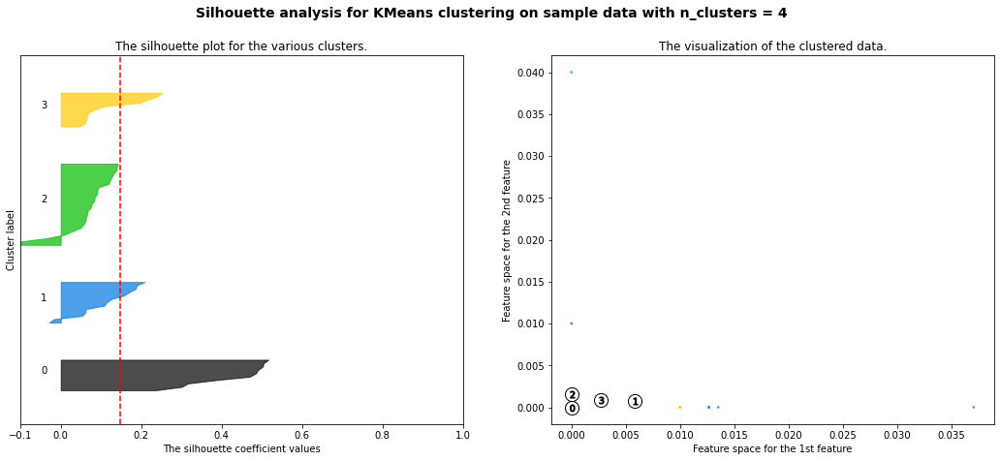

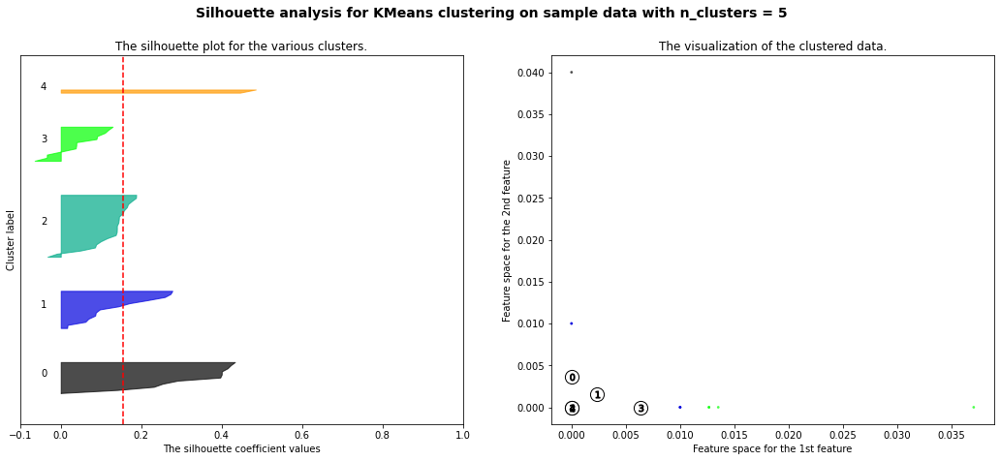

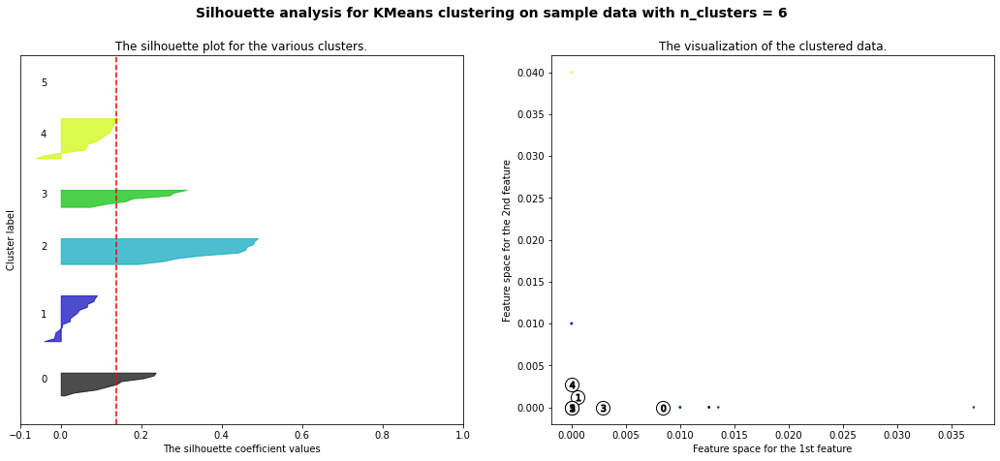

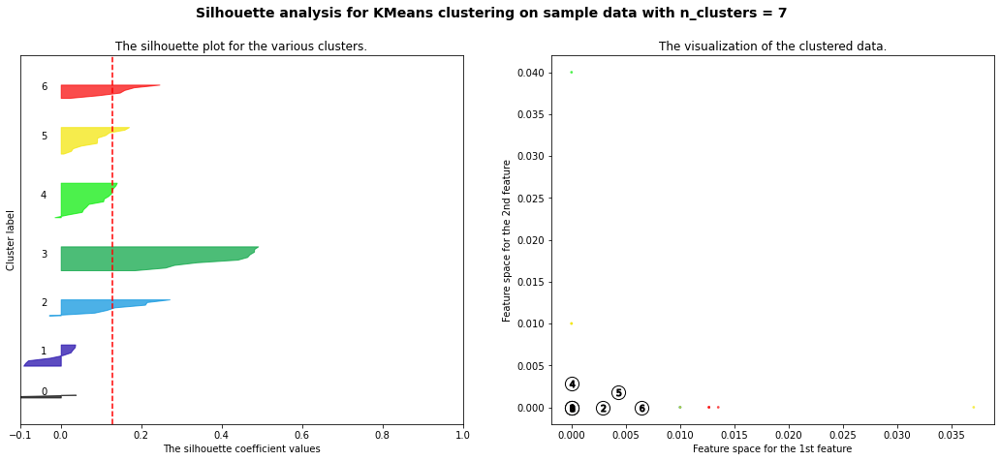

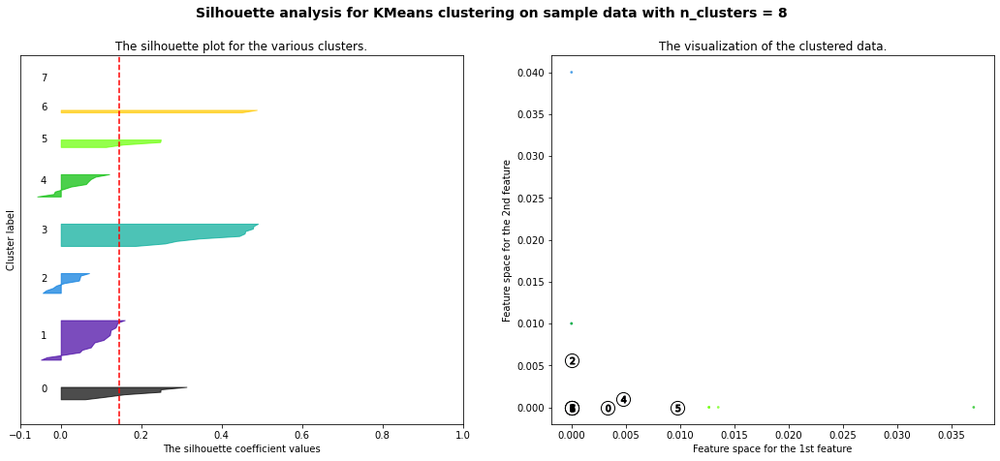

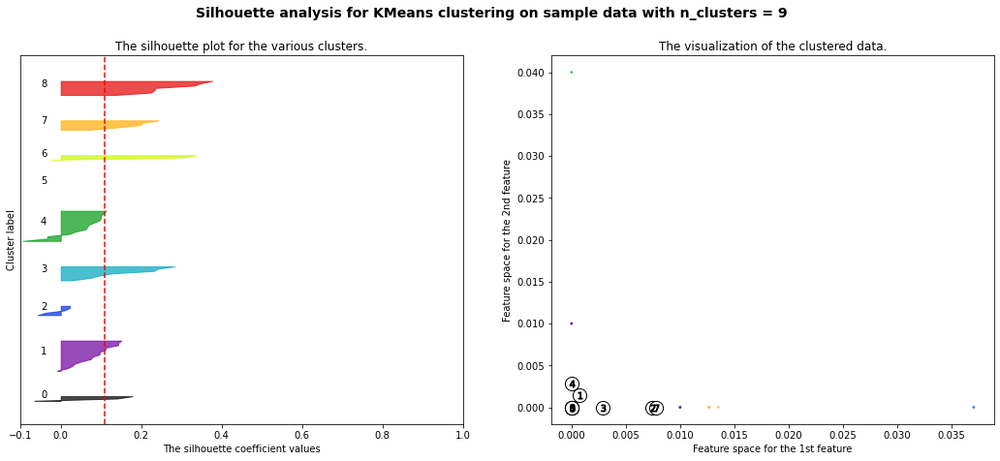

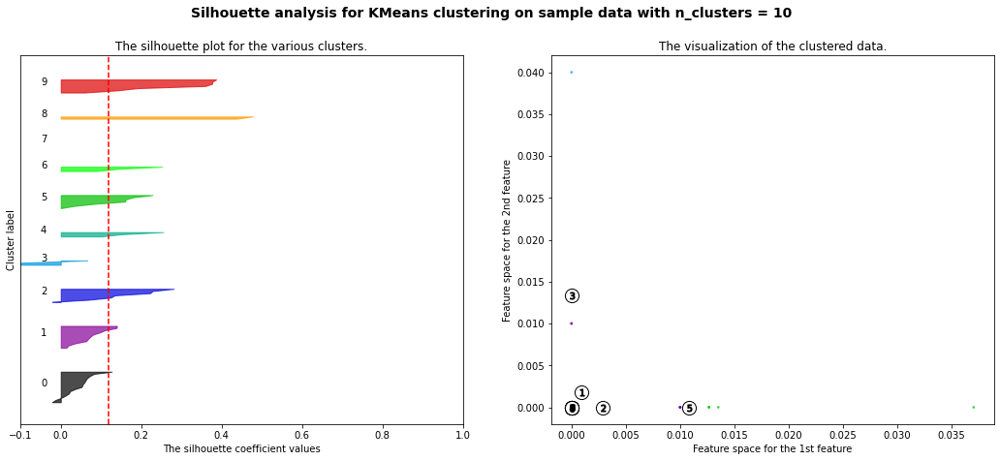

In [42]:
# Silhouette score analysis to help determine K
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(chicago_grouped_clustering.values) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(chicago_grouped_clustering.values)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(chicago_grouped_clustering.values, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(chicago_grouped_clustering.values, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(chicago_grouped_clustering.values[:, 0], chicago_grouped_clustering.values[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

In [ ]:
# set number of clusters
kclusters = 4



In [ ]:
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(chicago_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

In [ ]:
# add clustering labels
zipcode_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

chicago_merged = chicago_data


# merge chicago_grouped with chicago_data to add latitude/longitude for each zipcode
chicago_merged = chicago_merged.join(zipcode_venues_sorted.set_index('ZIP Code'), on='ZIP Code')

chicago_merged["Cluster Labels"]=chicago_merged["Cluster Labels"] + 1

chicago_merged.head() # check the last columns!

In [46]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as colors

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]


folium.GeoJson(city_geo).add_to(map_clusters)    
  
    

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(chicago_merged['Latitude'], chicago_merged['Longitude'], chicago_merged['ZIP Code'], chicago_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1).add_to(map_clusters)
    
map_clusters

In [ ]:
chicago_merged.head()

#### Cluster 1

In [48]:
chicago_merged.loc[chicago_merged['Cluster Labels'] == 1, chicago_merged.columns[[0] + list(range(12, chicago_merged.shape[1]))]]

,ZIP Code,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,60608,Mexican Restaurant,Bar,Coffee Shop,Italian Restaurant,Pizza Place,Art Gallery,Dessert Shop,Breakfast Spot,Park,Bakery
8,60609,Sandwich Place,Mexican Restaurant,Art Gallery,Fast Food Restaurant,Park,Donut Shop,Pizza Place,Hot Dog Joint,Grocery Store,Bar
16,60617,Mexican Restaurant,Fast Food Restaurant,Discount Store,Bank,Harbor / Marina,Sandwich Place,Grocery Store,Convenience Store,Supermarket,Donut Shop
22,60623,Mexican Restaurant,Sandwich Place,Discount Store,Taco Place,Bank,Pizza Place,Mobile Phone Shop,Donut Shop,Pharmacy,Gym / Fitness Center
27,60629,Mexican Restaurant,Discount Store,Sandwich Place,Pharmacy,Pizza Place,Fast Food Restaurant,Taco Place,Donut Shop,Video Store,Grocery Store
30,60632,Mexican Restaurant,Sandwich Place,Grocery Store,Bar,Taco Place,Discount Store,Pizza Place,Bank,Coffee Shop,Café
32,60634,Fast Food Restaurant,Mexican Restaurant,Clothing Store,Cosmetics Shop,Sandwich Place,Coffee Shop,Italian Restaurant,Bakery,Pizza Place,Deli / Bodega
35,60638,Pizza Place,Rental Car Location,Mexican Restaurant,Convenience Store,Donut Shop,American Restaurant,Sandwich Place,Fast Food Restaurant,Bakery,Supermarket
36,60639,Mexican Restaurant,Donut Shop,Grocery Store,Fast Food Restaurant,Pharmacy,American Restaurant,Bank,Discount Store,Sandwich Place,Supermarket
40,60643,Pizza Place,Sandwich Place,Bar,Pharmacy,Donut Shop,Grocery Store,Fried Chicken Joint,Gas Station,Breakfast Spot,Brewery


#### Cluster 2

In [49]:
chicago_merged.loc[chicago_merged['Cluster Labels'] == 2, chicago_merged.columns[[0] + list(range(12, chicago_merged.shape[1]))]]

,ZIP Code,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
11,60612,Restaurant,Brewery,Mexican Restaurant,Breakfast Spot,Coffee Shop,Dive Bar,Bar,Pizza Place,Park,Grocery Store
12,60613,Pizza Place,Bar,Coffee Shop,Italian Restaurant,Café,Sports Bar,American Restaurant,Brewery,Bakery,Vegetarian / Vegan Restaurant
13,60614,Pizza Place,Coffee Shop,Grocery Store,Park,Liquor Store,Gym,Bakery,Sushi Restaurant,Seafood Restaurant,Italian Restaurant
14,60615,Coffee Shop,Park,Science Museum,Art Gallery,Beach,BBQ Joint,Café,History Museum,Pizza Place,Breakfast Spot
15,60616,Chinese Restaurant,Pizza Place,Park,Asian Restaurant,Hot Dog Joint,Mexican Restaurant,Bar,Café,Dessert Shop,Burger Joint
17,60618,Brewery,Café,Park,Coffee Shop,Burger Joint,Bar,Mexican Restaurant,Grocery Store,Italian Restaurant,Beer Store
21,60622,Coffee Shop,Bakery,Breakfast Spot,Pizza Place,Bookstore,Bar,Record Shop,Falafel Restaurant,Japanese Restaurant,Vegetarian / Vegan Restaurant
24,60625,Park,Bar,Bakery,Pizza Place,Mexican Restaurant,Grocery Store,New American Restaurant,Coffee Shop,American Restaurant,Korean Restaurant
25,60626,Park,Beach,Mexican Restaurant,Coffee Shop,Café,Pizza Place,Grocery Store,Gym,Thai Restaurant,Indian Restaurant
28,60630,Park,Coffee Shop,Pizza Place,Mexican Restaurant,Bar,Grocery Store,Bakery,American Restaurant,Chinese Restaurant,Brewery


#### Cluster 3

In [50]:
chicago_merged.loc[chicago_merged['Cluster Labels'] == 3, chicago_merged.columns[[0] + list(range(12, chicago_merged.shape[1]))]]

,ZIP Code,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
18,60619,Lounge,Sandwich Place,Donut Shop,Fast Food Restaurant,Gas Station,Bar,Fried Chicken Joint,Seafood Restaurant,Pharmacy,Chinese Restaurant
19,60620,Discount Store,Sandwich Place,Fast Food Restaurant,Lounge,Pharmacy,Seafood Restaurant,Donut Shop,Fried Chicken Joint,Grocery Store,Mexican Restaurant
20,60621,Fast Food Restaurant,Gas Station,Sandwich Place,Fried Chicken Joint,American Restaurant,Discount Store,Grocery Store,Donut Shop,Seafood Restaurant,Train Station
23,60624,Sandwich Place,Fast Food Restaurant,Park,Train Station,Bank,Discount Store,Sports Bar,American Restaurant,Gas Station,Mobile Phone Shop
26,60628,Sandwich Place,Fast Food Restaurant,Fried Chicken Joint,Discount Store,Liquor Store,Pharmacy,Grocery Store,Train Station,Donut Shop,Chinese Restaurant
31,60633,Bar,Park,Pizza Place,Lounge,Golf Course,Home Service,Harbor / Marina,River,Mexican Restaurant,Hill
33,60636,Fast Food Restaurant,Discount Store,Grocery Store,Mexican Restaurant,Donut Shop,Sandwich Place,American Restaurant,Fried Chicken Joint,Pharmacy,Park
41,60644,Discount Store,Park,Seafood Restaurant,Donut Shop,Fast Food Restaurant,ATM,Breakfast Spot,Fried Chicken Joint,Sandwich Place,Record Shop
45,60649,Discount Store,Fast Food Restaurant,Bank,Pizza Place,Sandwich Place,Fried Chicken Joint,Park,Chinese Restaurant,Harbor / Marina,Supermarket
48,60653,Beach,Sandwich Place,Art Gallery,Train Station,BBQ Joint,Historic Site,Fast Food Restaurant,Seafood Restaurant,Lounge,Pizza Place


#### Cluster 4

In [51]:
chicago_merged.loc[chicago_merged['Cluster Labels'] == 4, chicago_merged.columns[[0] + list(range(12, chicago_merged.shape[1]))]]

,ZIP Code,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,60601,Hotel,Italian Restaurant,New American Restaurant,Coffee Shop,Park,Steakhouse,Theater,Grocery Store,American Restaurant,Bar
1,60602,Hotel,Italian Restaurant,Park,Bar,Theater,Steakhouse,Coffee Shop,Seafood Restaurant,Mediterranean Restaurant,Grocery Store
2,60603,Hotel,Italian Restaurant,Park,Bar,Theater,Coffee Shop,Mediterranean Restaurant,Steakhouse,Grocery Store,Donut Shop
3,60604,Hotel,Park,Steakhouse,Theater,New American Restaurant,Italian Restaurant,Coffee Shop,Grocery Store,Bar,Mediterranean Restaurant
4,60605,Park,Aquarium,Hotel,Theater,Grocery Store,Planetarium,Coffee Shop,History Museum,Beach,Football Stadium
5,60606,Hotel,Italian Restaurant,New American Restaurant,Bar,Coffee Shop,Mediterranean Restaurant,Mexican Restaurant,Steakhouse,Grocery Store,Theater
6,60607,Italian Restaurant,Hotel,Coffee Shop,New American Restaurant,Yoga Studio,Sandwich Place,Grocery Store,Pizza Place,Park,Ice Cream Shop
9,60610,Steakhouse,Hotel,New American Restaurant,Italian Restaurant,Grocery Store,Coffee Shop,Restaurant,Spa,Seafood Restaurant,Theater
10,60611,Hotel,American Restaurant,New American Restaurant,Steakhouse,Café,Donut Shop,Italian Restaurant,Park,Toy / Game Store,Tour Provider
49,60654,Hotel,New American Restaurant,Italian Restaurant,Mediterranean Restaurant,Steakhouse,Theater,Mexican Restaurant,Bar,Spa,Seafood Restaurant


### Choropleths for Cases, Deaths, and Tests

In [ ]:
city_data=chicago_merged

In [ ]:
city_data["ZIP Code"]=city_data["ZIP Code"].astype(str)

#### By Cases

In [55]:
# create map
cases_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
#x = np.arange(kclusters)
#ys = [i + x + (i*x)**2 for i in range(kclusters)]
#colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
#rainbow = [colors.rgb2hex(i) for i in colors_array]


folium.GeoJson(city_geo).add_to(cases_clusters)    
    
folium.Choropleth(
    geo_data=city_geo,
    name="choropleth",
    data=city_data,
    columns=["ZIP Code", "Cases per 100K"],
    key_on="feature.properties.zip",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Covid-19 Cases per 100K",
).add_to(cases_clusters)    
    

# add markers to the map
#markers_colors = []
for lat, lon, poi, cluster in zip(chicago_merged['Latitude'], chicago_merged['Longitude'], chicago_merged['ZIP Code'], chicago_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1).add_to(cases_clusters)
    
cases_clusters

In [ ]:
top_case_df=chicago_merged.sort_values(by="Cases per 100K", ascending=False)

top_case_df=top_case_df.head(10)
top_case_df.reset_index(drop=True,inplace=True)


In [ ]:
top_cases=folium.Map(location=[latitude,longitude], zoom_start=11)

folium.GeoJson(city_geo).add_to(top_cases)

folium.Choropleth(
    geo_data=city_geo,
    name="choropleth",
    data=city_data,
    columns=["ZIP Code", "Cases per 100K"],
    key_on="feature.properties.zip",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Covid-19 Cases per 100K",
).add_to(top_cases)  

for lat, lon, poi, cluster in zip(top_case_df['Latitude'], top_case_df['Longitude'], top_case_df['ZIP Code'], top_case_df.index+1):
    label = folium.Popup(str(poi) + ' Case Rate Rank ' + str(cluster), parse_html=True)
    folium.Marker(
        [lat, lon],
        popup=label
        ).add_to(top_cases)
    

top_cases

In [58]:
top_case_df[["ZIP Code", "Cases per 100K", "Population", "Cluster Labels", "1st Most Common Venue", "2nd Most Common Venue", "3rd Most Common Venue", "4th Most Common Venue", "5th Most Common Venue", "6th Most Common Venue", "7th Most Common Venue", "8th Most Common Venue", "9th Most Common Venue", "10th Most Common Venue"]]

,ZIP Code,Cases per 100K,Population,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,60639,15600.4,90517,1,Mexican Restaurant,Donut Shop,Grocery Store,Fast Food Restaurant,Pharmacy,American Restaurant,Bank,Discount Store,Sandwich Place,Supermarket
1,60629,15018.3,111850,1,Mexican Restaurant,Discount Store,Sandwich Place,Pharmacy,Pizza Place,Fast Food Restaurant,Taco Place,Donut Shop,Video Store,Grocery Store
2,60632,14323.5,91039,1,Mexican Restaurant,Sandwich Place,Grocery Store,Bar,Taco Place,Discount Store,Pizza Place,Bank,Coffee Shop,Café
3,60634,13237.7,75995,1,Fast Food Restaurant,Mexican Restaurant,Clothing Store,Cosmetics Shop,Sandwich Place,Coffee Shop,Italian Restaurant,Bakery,Pizza Place,Deli / Bodega
4,60604,13171.4,782,4,Hotel,Park,Steakhouse,Theater,New American Restaurant,Italian Restaurant,Coffee Shop,Grocery Store,Bar,Mediterranean Restaurant
5,60638,12937.7,58797,1,Pizza Place,Rental Car Location,Mexican Restaurant,Convenience Store,Donut Shop,American Restaurant,Sandwich Place,Fast Food Restaurant,Bakery,Supermarket
6,60623,12385.6,85979,1,Mexican Restaurant,Sandwich Place,Discount Store,Taco Place,Bank,Pizza Place,Mobile Phone Shop,Donut Shop,Pharmacy,Gym / Fitness Center
7,60641,12314.3,71023,2,Mexican Restaurant,Coffee Shop,Park,Diner,Pizza Place,Asian Restaurant,Café,Sandwich Place,Bar,American Restaurant
8,60651,11990.3,63218,1,Mexican Restaurant,Donut Shop,Discount Store,Sandwich Place,Grocery Store,Fried Chicken Joint,Fast Food Restaurant,Gas Station,Pharmacy,Video Store
9,60655,11703.2,28804,1,Pizza Place,Mexican Restaurant,Sandwich Place,Bar,Italian Restaurant,Pharmacy,Fast Food Restaurant,Breakfast Spot,Pub,Convenience Store


##### Deaths

In [59]:
# create map
deaths_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
#x = np.arange(kclusters)
#ys = [i + x + (i*x)**2 for i in range(kclusters)]
#colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
#rainbow = [colors.rgb2hex(i) for i in colors_array]


folium.GeoJson(city_geo).add_to(deaths_clusters)    
    
folium.Choropleth(
    geo_data=city_geo,
    name="choropleth",
    data=city_data,
    columns=["ZIP Code", "Deaths per 100K"],
    key_on="feature.properties.zip",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Covid-19 Deaths per 100K",
).add_to(deaths_clusters)    
    

# add markers to the map
#markers_colors = []
for lat, lon, poi, cluster in zip(chicago_merged['Latitude'], chicago_merged['Longitude'], chicago_merged['ZIP Code'], chicago_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1).add_to(deaths_clusters)
    
deaths_clusters

In [ ]:
top_death_df=chicago_merged.sort_values(by="Deaths per 100K", ascending=False)

top_death_df=top_death_df.head(10)
top_death_df.reset_index(drop=True,inplace=True)

In [ ]:
top_deaths=folium.Map(location=[latitude,longitude], zoom_start=11)

folium.GeoJson(city_geo).add_to(top_deaths)

folium.Choropleth(
    geo_data=city_geo,
    name="choropleth",
    data=city_data,
    columns=["ZIP Code", "Deaths per 100K"],
    key_on="feature.properties.zip",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Covid-19 Deaths per 100K",
).add_to(top_deaths)  

for lat, lon, poi, cluster in zip(top_death_df['Latitude'], top_death_df['Longitude'], top_death_df['ZIP Code'], top_death_df.index+1):
    label = folium.Popup(str(poi) + ' Death Rate Rank ' + str(cluster), parse_html=True)
    folium.Marker(
        [lat, lon],
        popup=label
        ).add_to(top_deaths)
    

top_deaths

In [62]:
top_death_df[["ZIP Code", "Deaths per 100K", "Population", "Cluster Labels", "1st Most Common Venue", "2nd Most Common Venue", "3rd Most Common Venue", "4th Most Common Venue", "5th Most Common Venue", "6th Most Common Venue", "7th Most Common Venue", "8th Most Common Venue", "9th Most Common Venue", "10th Most Common Venue"]]

,ZIP Code,Deaths per 100K,Population,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,60649,328.1,46024,3,Discount Store,Fast Food Restaurant,Bank,Pizza Place,Sandwich Place,Fried Chicken Joint,Park,Chinese Restaurant,Harbor / Marina,Supermarket
1,60626,319.7,49730,2,Park,Beach,Mexican Restaurant,Coffee Shop,Café,Pizza Place,Grocery Store,Gym,Thai Restaurant,Indian Restaurant
2,60631,314.9,29529,2,Italian Restaurant,American Restaurant,Coffee Shop,Salon / Barbershop,Pizza Place,Mexican Restaurant,Park,Sushi Restaurant,Grocery Store,Pharmacy
3,60636,304.3,32203,3,Fast Food Restaurant,Discount Store,Grocery Store,Mexican Restaurant,Donut Shop,Sandwich Place,American Restaurant,Fried Chicken Joint,Pharmacy,Park
4,60628,292.2,66724,3,Sandwich Place,Fast Food Restaurant,Fried Chicken Joint,Discount Store,Liquor Store,Pharmacy,Grocery Store,Train Station,Donut Shop,Chinese Restaurant
5,60623,288.4,85979,1,Mexican Restaurant,Sandwich Place,Discount Store,Taco Place,Bank,Pizza Place,Mobile Phone Shop,Donut Shop,Pharmacy,Gym / Fitness Center
6,60621,275.5,29042,3,Fast Food Restaurant,Gas Station,Sandwich Place,Fried Chicken Joint,American Restaurant,Discount Store,Grocery Store,Donut Shop,Seafood Restaurant,Train Station
7,60639,253.0,90517,1,Mexican Restaurant,Donut Shop,Grocery Store,Fast Food Restaurant,Pharmacy,American Restaurant,Bank,Discount Store,Sandwich Place,Supermarket
8,60643,250.7,49870,1,Pizza Place,Sandwich Place,Bar,Pharmacy,Donut Shop,Grocery Store,Fried Chicken Joint,Gas Station,Breakfast Spot,Brewery
9,60644,249.4,47712,3,Discount Store,Park,Seafood Restaurant,Donut Shop,Fast Food Restaurant,ATM,Breakfast Spot,Fried Chicken Joint,Sandwich Place,Record Shop


#### Tests

In [67]:
# create map
tests_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
#x = np.arange(kclusters)
#ys = [i + x + (i*x)**2 for i in range(kclusters)]
#colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
#rainbow = [colors.rgb2hex(i) for i in colors_array]


folium.GeoJson(city_geo).add_to(tests_clusters)    
    
folium.Choropleth(
    geo_data=city_geo,
    name="choropleth",
    data=city_data,
    columns=["ZIP Code", "Tests per 100K"],
    key_on="feature.properties.zip",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Covid-19 Tests per 100K",
).add_to(tests_clusters)    
    

# add markers to the map
#markers_colors = []
for lat, lon, poi, cluster in zip(chicago_merged['Latitude'], chicago_merged['Longitude'], chicago_merged['ZIP Code'], chicago_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1).add_to(tests_clusters)
    
tests_clusters

In [ ]:
top_test_df=chicago_merged.sort_values(by="Tests per 100K", ascending=False)

top_test_df=top_test_df.head(10)
top_test_df.reset_index(drop=True,inplace=True)

In [ ]:
top_tests=folium.Map(location=[latitude,longitude], zoom_start=11)

folium.GeoJson(city_geo).add_to(top_tests)

folium.Choropleth(
    geo_data=city_geo,
    name="choropleth",
    data=city_data,
    columns=["ZIP Code", "Tests per 100K"],
    key_on="feature.properties.zip",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Covid-19 Tests per 100K",
).add_to(top_tests)  

for lat, lon, poi, cluster in zip(top_test_df['Latitude'], top_test_df['Longitude'], top_test_df['ZIP Code'], top_test_df.index+1):
    label = folium.Popup(str(poi) + ' Test Rate Rank ' + str(cluster), parse_html=True)
    folium.Marker(
        [lat, lon],
        popup=label
        ).add_to(top_tests)

top_tests

In [66]:
top_test_df[["ZIP Code", "Tests per 100K", "Population", "Cluster Labels", "1st Most Common Venue", "2nd Most Common Venue", "3rd Most Common Venue", "4th Most Common Venue", "5th Most Common Venue", "6th Most Common Venue", "7th Most Common Venue", "8th Most Common Venue", "9th Most Common Venue", "10th Most Common Venue"]]

,ZIP Code,Tests per 100K,Population,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,60604,362532.0,782,4,Hotel,Park,Steakhouse,Theater,New American Restaurant,Italian Restaurant,Coffee Shop,Grocery Store,Bar,Mediterranean Restaurant
1,60637,271543.0,47454,2,Science Museum,Park,Coffee Shop,Bookstore,Café,Pizza Place,History Museum,Grocery Store,Caribbean Restaurant,Spa
2,60606,266075.5,3101,4,Hotel,Italian Restaurant,New American Restaurant,Bar,Coffee Shop,Mediterranean Restaurant,Mexican Restaurant,Steakhouse,Grocery Store,Theater
3,60626,234456.1,49730,2,Park,Beach,Mexican Restaurant,Coffee Shop,Café,Pizza Place,Grocery Store,Gym,Thai Restaurant,Indian Restaurant
4,60612,212241.0,34311,2,Restaurant,Brewery,Mexican Restaurant,Breakfast Spot,Coffee Shop,Dive Bar,Bar,Pizza Place,Park,Grocery Store
5,60607,203362.5,29591,4,Italian Restaurant,Hotel,Coffee Shop,New American Restaurant,Yoga Studio,Sandwich Place,Grocery Store,Pizza Place,Park,Ice Cream Shop
6,60603,201873.9,1174,4,Hotel,Italian Restaurant,Park,Bar,Theater,Coffee Shop,Mediterranean Restaurant,Steakhouse,Grocery Store,Donut Shop
7,60602,190594.9,1244,4,Hotel,Italian Restaurant,Park,Bar,Theater,Steakhouse,Coffee Shop,Seafood Restaurant,Mediterranean Restaurant,Grocery Store
8,60614,188095.3,71308,2,Pizza Place,Coffee Shop,Grocery Store,Park,Liquor Store,Gym,Bakery,Sushi Restaurant,Seafood Restaurant,Italian Restaurant
9,60615,183369.8,41563,2,Coffee Shop,Park,Science Museum,Art Gallery,Beach,BBQ Joint,Café,History Museum,Pizza Place,Breakfast Spot
